In [2]:
import os
import json
from PIL import Image, ImageDraw
import re
import numpy as np
import cv2
import imageio
import matplotlib.pyplot as plt
import tifffile as tiff
from tqdm import tqdm
from skimage.exposure import equalize_adapthist
from scipy.stats import stats
import matplotlib.animation as animation
import pandas as pd
import csv
import shutil
from skimage.morphology import dilation, erosion



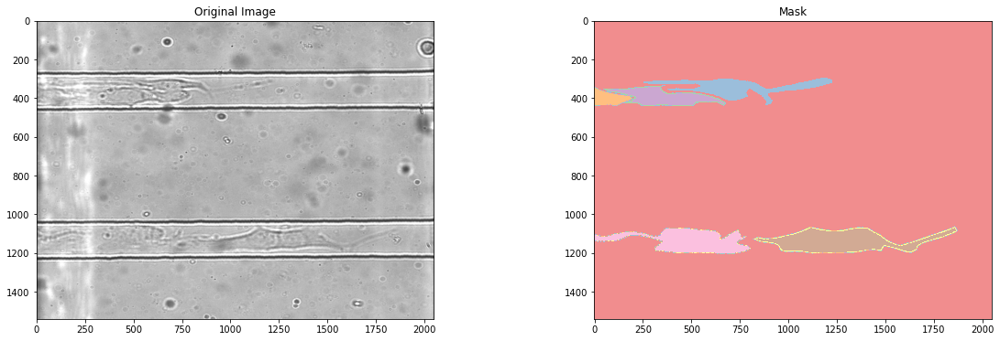

(1541, 2048)
(1541, 2048)


In [2]:
import tifffile as tiff
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20, 6)
og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_Merge_2298_A/01/t0007.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_Merge_2298_A/01_ST/SEG/man_seg0007.tif")
#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(og_img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(gt_mask,cmap='Set1', alpha=0.5)
ax[0].set_title("Original Image")
ax[1].set_title("Mask")
plt.show()
print(og_img.shape)
print(gt_mask.shape)

# og_img = tiff.imread(f"/home/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data/02/t{i:04d}.tif")
# gt_mask=tiff.imread(f"/home/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data/02_GT/SEG/man_seg{i:04d}.tif")
# plt.imshow(og_img, cmap='gist_gray',alpha=0.9)
# plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
# plt.imshow(gt_mask, cmap='Set1',alpha=0.5)

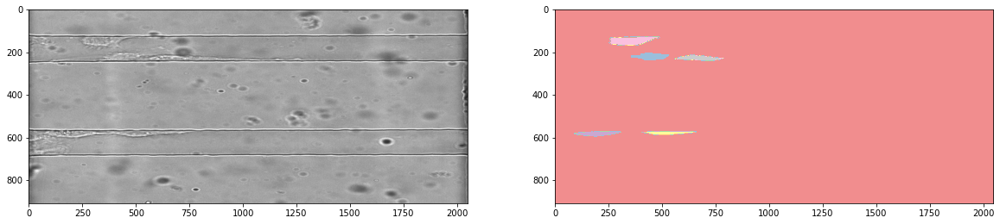

(908, 2048)
(908, 2048)


In [28]:
import tifffile as tiff
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20, 6)
og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part1_500/02/t0012.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part1_500/02_GT/SEG/man_seg0012.tif")
#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(og_img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(gt_mask,cmap='Set1', alpha=0.5)
plt.show()
print(og_img.shape)
print(gt_mask.shape)

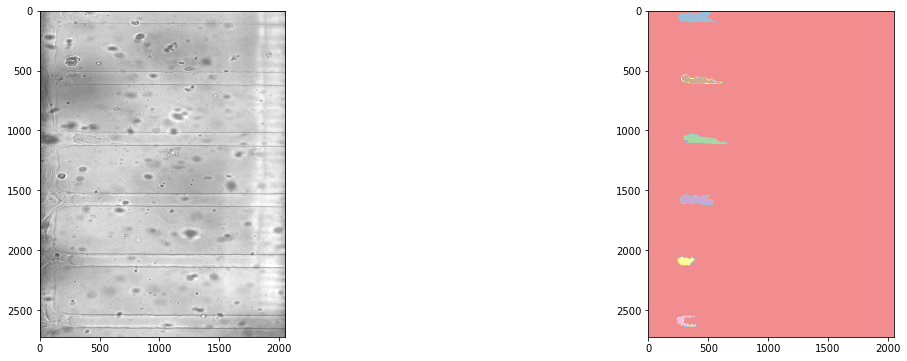

(2724, 2048)
(2724, 2048)


In [3]:
import tifffile as tiff
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20, 6)
og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part2/01/t0012.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part2/01_ST/SEG/man_seg0012.tif")
#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(og_img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(gt_mask,cmap='Set1', alpha=0.5)
plt.show()
print(og_img.shape)
print(gt_mask.shape)

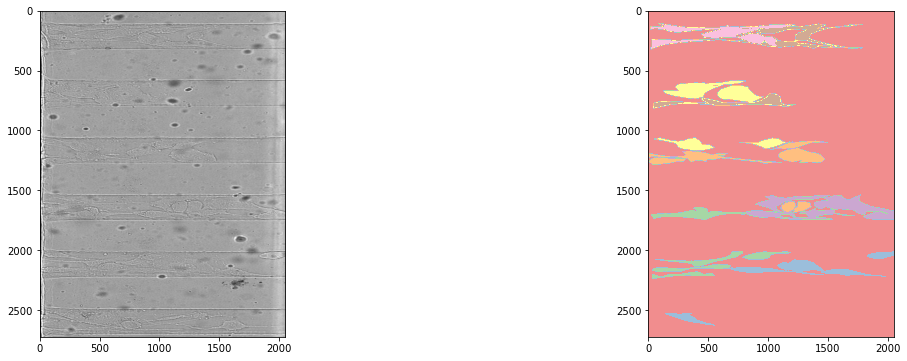

(2724, 2048)
(2724, 2048)


In [4]:
import tifffile as tiff
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20, 6)
og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part2/02/t0012.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part2/02_GT/SEG/man_seg0012.tif")
#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(og_img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(gt_mask,cmap='Set1', alpha=0.5)
plt.show()
print(og_img.shape)
print(gt_mask.shape)

In [18]:
import numpy as np
asp = 1936 / 1456 # Finding the aspect ration of the 6 row image (i.e. if you have 6 rows of cells, this is the aspect ratio)
print(asp)

new_width = 2048 # from 1456 -> 2048. I somewhat arbitrarily pick a new width of 2048, as it is larger than the original 1456
new_heigt = np.ceil((1/asp) * new_width)  # Using the aspect ratio and the new width, we can find the new height for a 6 row image
print(new_width, new_heigt)

print(new_width, new_heigt * 3)  # So for images that have only 2 rows of cells, this will be the new resolution (divie the 6 row image by 3 to get 2 rows).

1.3296703296703296
2048 1541.0
2048 4623.0


(2048, 4623)


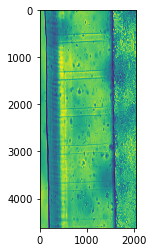

(2048, 1541)


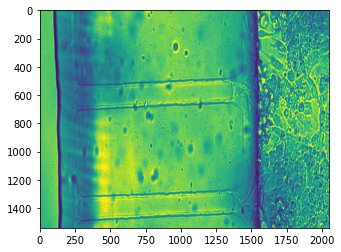

In [19]:
from PIL import Image, ImageDraw

img = Image.open(f'/home/MinaHossain/Label_5004/Label_Me_images/MM-20230613001/00150.jpg').convert('L').rotate(90, expand=True)
img = img.resize((2048, 4623))
print(img.size)
plt.imshow(img)
plt.show()

img = img.crop((0, 0, 2048, 1541))
print(img.size)
plt.imshow(img)

(1936, 1456)


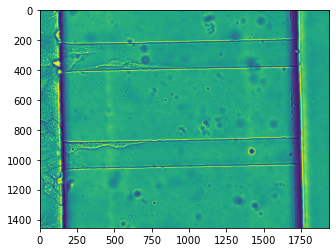

(2048, 1541)


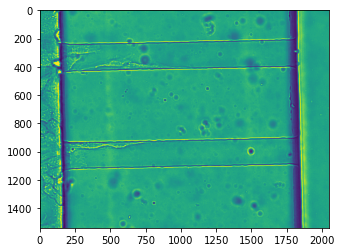

In [20]:
img = Image.open(f'/home/MinaHossain/Label_5004/BD_5004/images/img_1.png').convert('L')
print(img.size)
plt.imshow(img)
plt.show()

img = img.resize((2048, 1541))
print(img.size)
plt.imshow(img)

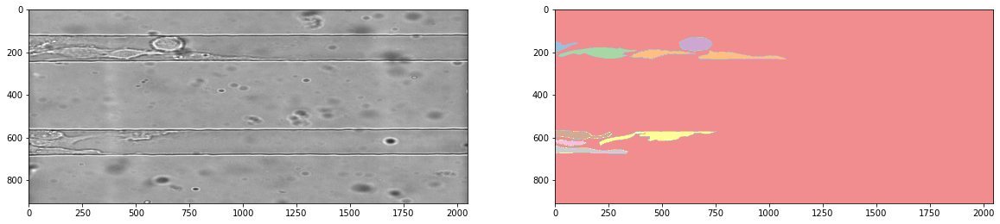

(908, 2048)
(908, 2048)


In [5]:
import tifffile as tiff
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20, 6)
og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_Merge_2298/01/t0480.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_Merge_2298/01_ST/SEG/man_seg0480.tif")
#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(og_img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(gt_mask,cmap='Set1', alpha=0.5)
plt.show()
print(og_img.shape)
print(gt_mask.shape)

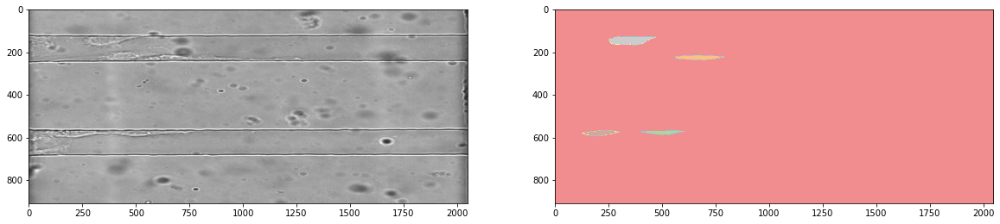

(908, 2048)
(908, 2048)


In [6]:
import tifffile as tiff
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20, 6)
og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_Merge_2298/02/t0022.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_Merge_2298/02_GT/SEG/man_seg0015.tif")
#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(og_img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(gt_mask,cmap='Set1', alpha=0.5)
plt.show()
print(og_img.shape)
print(gt_mask.shape)

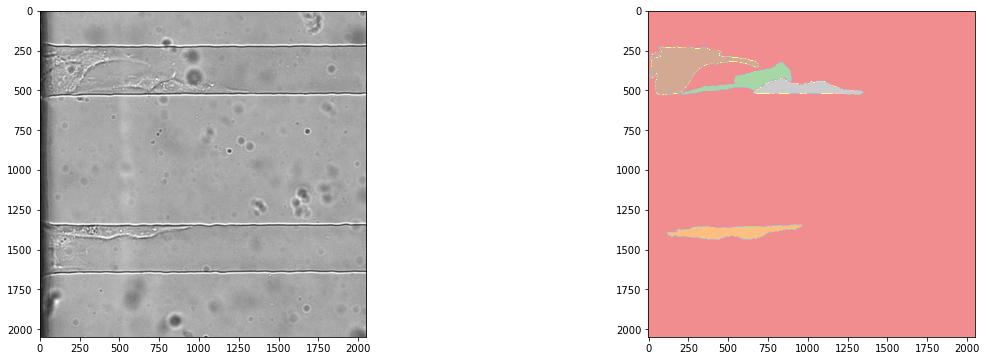

(2048, 2048)
(2048, 2048)


In [38]:
import tifffile as tiff
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20, 6)
og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data-ML-1798/01/t0018.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data-ML-1798/01_ST/SEG/man_seg0018.tif")
#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(og_img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(gt_mask,cmap='Set1', alpha=0.5)
plt.show()
print(og_img.shape)
print(gt_mask.shape)

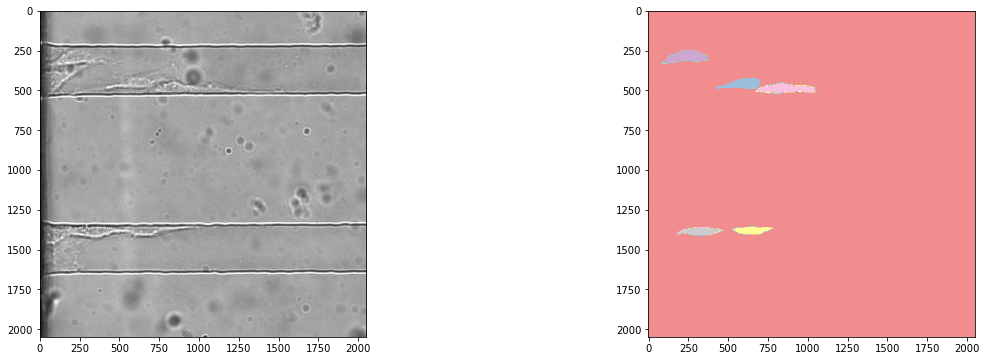

In [37]:
import tifffile as tiff
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

fig, ax = plt.subplots(1, 2)
fig.set_size_inches(20, 6)
# og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_1798/01/t0018.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

# gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_1798/01_ST/SEG/man_seg0018.tif")
cropping = (160, 100, 1360, 1300)
rotation = -1
resize = (1024*2, 1024*2)

# img = Image.open(f"/home/MinaHossain/Label_5004/Cell_Data_1798/01/t0050.tif")

img=Image.open(f"/home/MinaHossain/Label_5004/Cell_Data_1798/02/t0018.tif")
img = img.rotate(rotation, expand=True)
img = img.crop(cropping)
img = img.resize(resize)

# mask=Image.open(f"/home/MinaHossain/Label_5004/Cell_Data_1798/01_ST/SEG/man_seg0050.tif")

mask=Image.open(f"/home/MinaHossain/Label_5004/Cell_Data_1798/02_GT/SEG/man_seg0018.tif")
mask = mask.rotate(rotation, expand=True)
mask = mask.crop(cropping)
mask = mask.resize(resize)


#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(mask,cmap='Set1', alpha=0.5)
plt.show()


# print(og_img.shape)
# print(gt_mask.shape)

## New Training and Test Data Set : 2048 by 1541     replacing  2048 by 908

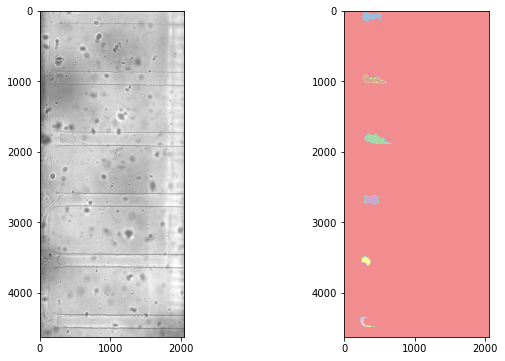

(4623, 2048)
(4623, 2048)


In [6]:
import tifffile as tiff
import matplotlib.pyplot as plt

# /home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part2/01/t0017.tif
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(10, 6)
og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part2/01/t0007.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part2/01_ST/SEG/man_seg0007.tif")
#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(og_img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(gt_mask,cmap='Set1', alpha=0.5)
plt.show()
print(og_img.shape)
print(gt_mask.shape)

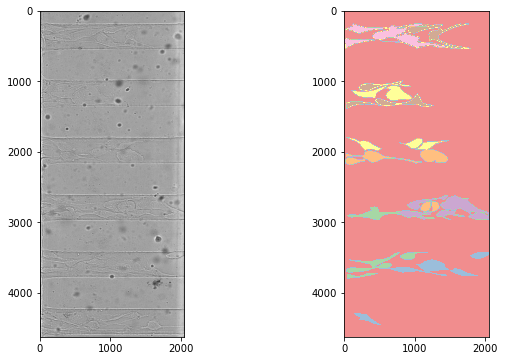

(4623, 2048)
(4623, 2048)


In [5]:
import tifffile as tiff
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 2)
fig.set_size_inches(10, 6)
og_img = tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part2/02/t0007.tif")
#plt.imshow(og_img, cmap='gist_gray',alpha=0.9)

gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/Cell_Data_LabelMe_Part2/02_GT/SEG/man_seg0007.tif")
#plt.imshow(gt_mask, cmap='Set1',alpha=0.5)
ax[0].imshow(og_img, cmap='gist_gray',alpha=0.9)
ax[1].imshow(gt_mask,cmap='Set1', alpha=0.5)
plt.show()
print(og_img.shape)
print(gt_mask.shape)

 # Creating plots with cell and their corresponding labels from the masks 

In [4]:
def make_np(img):
    return np.array(img)

def shuffle_labels(img, seed=789):
    # Find the unique labels, excluding 0 (background)
    array = make_np(img)
    unique_labels = np.unique(array[array != 0])

    # Generate new labels (random and unique) for each cell type
    # Ensure new labels do not conflict with existing labels
    # max_label = array.max()
    max_label = 0
    new_labels = np.arange(max_label + 1, max_label + 1 + len(unique_labels))

    # Randomly shuffle the new labels
    np.random.seed(seed)
    np.random.shuffle(new_labels)

    # Create a mapping from old labels to new labels
    label_mapping = {old: new for old, new in zip(unique_labels, new_labels)}

    # Apply the mapping to the array
    shuffled_array = np.copy(array)
    for old_label, new_label in label_mapping.items():
        shuffled_array[array == old_label] = new_label
    return shuffled_array

def plot_labels(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'},
                cmap='gist_earth'):
    ax.imshow(shuffled, cmap=cmap)
    ax.set_title(title)
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)


def read_changes(file_path, row):
    with open(file_path, 'r') as handle:
        reader = csv.reader(handle, delimiter=' ')
        for i in range(row):
            next(reader)
        curr_row = next(reader)
        tuples = [tuple(map(int, item.split(','))) for item in curr_row]
    return tuples

def relabel_image(original, file_path, row):
    tuples = read_changes(file_path, row)
    new_img = original.copy()
    for t in tuples:
        new_img[original == t[0]] = t[1]
    return new_img



def plot_raw(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'},
                cmap_raw='gray', cmap_seg='gist_earth', alpha=.5):
    ax.imshow(shuffled, cmap=cmap_raw)
    ax.set_title(title)
    
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)

    tmp_seg = shuffle_labels(make_np(original))
    tmp_seg = np.ma.masked_where(tmp_seg == 0, tmp_seg)
    ax.imshow(tmp_seg, alpha=alpha, cmap=cmap_seg)



# Load and process a specific image 

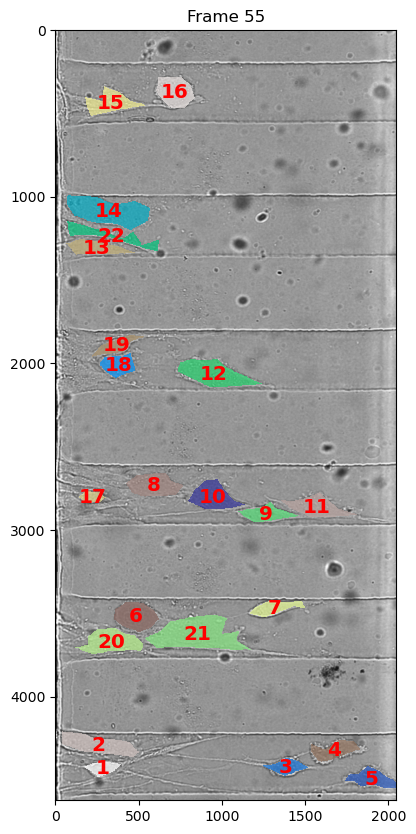

In [13]:

frame = 55
fig, ax = plt.subplots()
fig.set_size_inches(10, 10)  # Adjust size as needed

# Path to your image file
#####  f"/data/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data-P2/02/t{frame:04d}.tif"   # Original Image
#####  f"/home/MinaHossain/DMNet_Rina_Tracking/6row_images/02/t{frame:04d}.tif"       ######## Contrasted Image
image_path = f"/home/MinaHossain/Label_5004/6row_images_min_Original/02/t{frame:04d}.tif"
seg_img = Image.open(image_path).convert('L')
# seg_lab = Image.open(f"/home/MinaHossain/DMNet_Rina_Tracking/6row_images/02_GT/TRA/man_track{frame:04d}.tif").convert('L')
seg_lab = Image.open(f"/home/MinaHossain/Label_5004/6row_images_min_Original/02_GT/SEG/man_seg{frame:04d}.tif").convert('L')
# Assuming make_np converts the image to a numpy array and shuffle_labels shuffles labels
# seg_shuf = shuffle_labels(make_np(seg_img))
plot_raw(seg_img, make_np(seg_lab), ax, f"Frame {frame}",alpha=.7, cmap_seg='terrain')

plt.show()

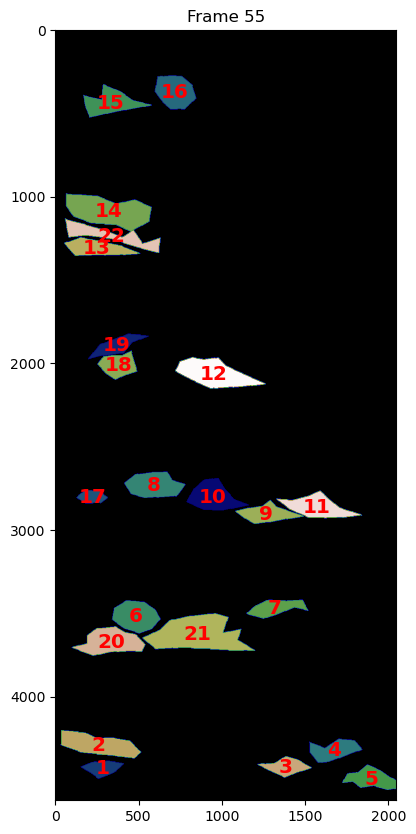

In [6]:
# Load and process a specific image
frame = 55
fig, ax = plt.subplots()
fig.set_size_inches(10, 10)  # Adjust size as needed

# Path to your image file
image_path = f"/home/MinaHossain/Label_5004/6row_images_min_Original/02_GT/SEG/man_seg{frame:04d}.tif"
seg_img = Image.open(image_path).convert('L')

# Assuming make_np converts the image to a numpy array and shuffle_labels shuffles labels
seg_shuf = shuffle_labels(make_np(seg_img))
plot_labels(seg_shuf, make_np(seg_img), ax, f"Frame {frame}")

plt.show()

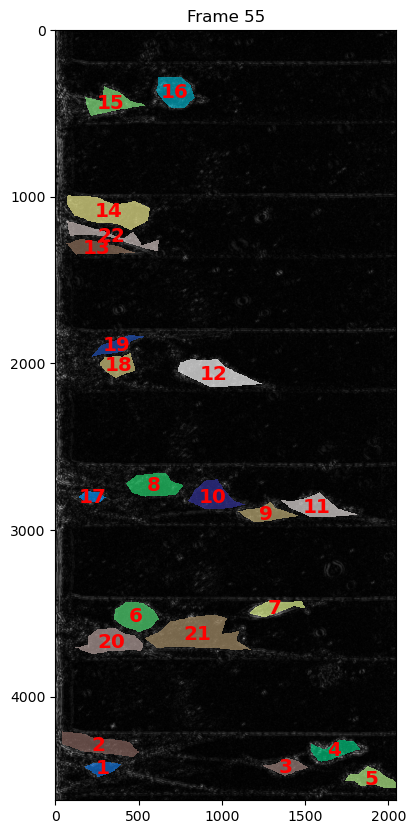

In [7]:
frame = 55
fig, ax = plt.subplots()
fig.set_size_inches(10, 10)  # Adjust size as needed

# Path to your image file
#####  f"/data/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data-P2/02/t{frame:04d}.tif"   # Original Image
#####  f"/home/MinaHossain/DMNet_Rina_Tracking/6row_images/02/t{frame:04d}.tif"       ######## Contrasted Image
image_path = f"/home/MinaHossain/Label_5004/6row_images_min_B/02/t{frame:04d}.tif"
seg_img = Image.open(image_path).convert('L')
# seg_lab = Image.open(f"/home/MinaHossain/DMNet_Rina_Tracking/6row_images/02_GT/TRA/man_track{frame:04d}.tif").convert('L')
seg_lab = Image.open(f"/home/MinaHossain/Label_5004/6row_images_min_B/02_GT/SEG/man_seg{frame:04d}.tif").convert('L')
# Assuming make_np converts the image to a numpy array and shuffle_labels shuffles labels
# seg_shuf = shuffle_labels(make_np(seg_img))
plot_raw(seg_img, make_np(seg_lab), ax, f"Frame {frame}",alpha=.7, cmap_seg='terrain')

plt.show()

# Creating plot of original image, Groung truth label Superimposed to original image, and the corresponding Groung Truth Mask.

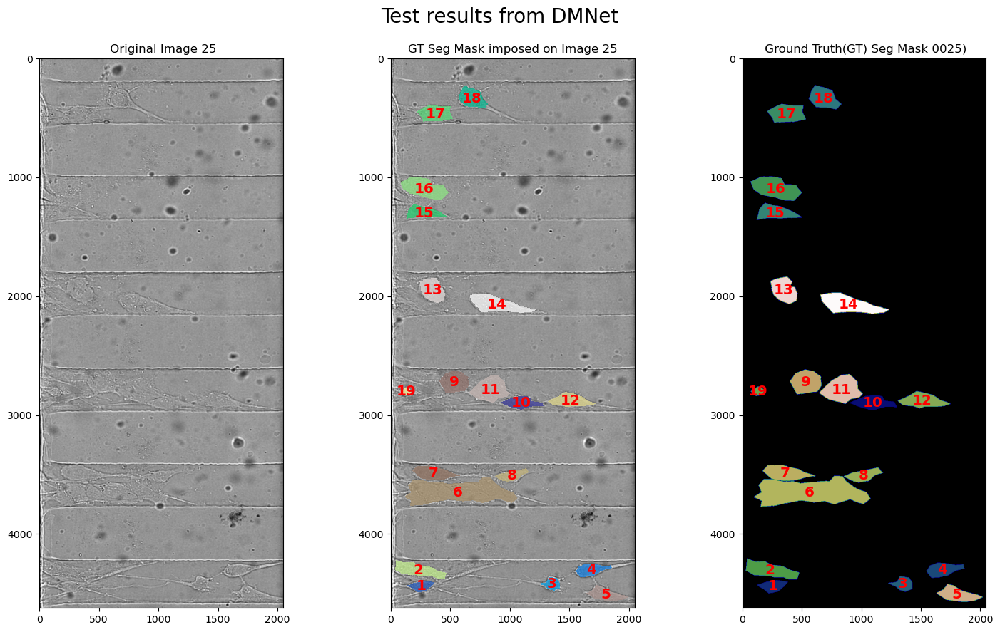

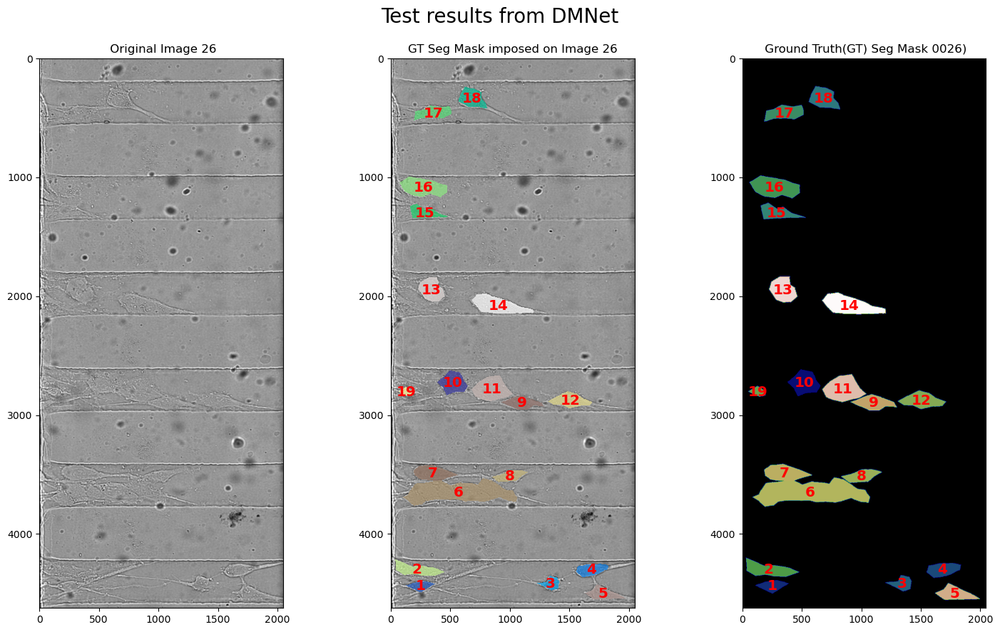

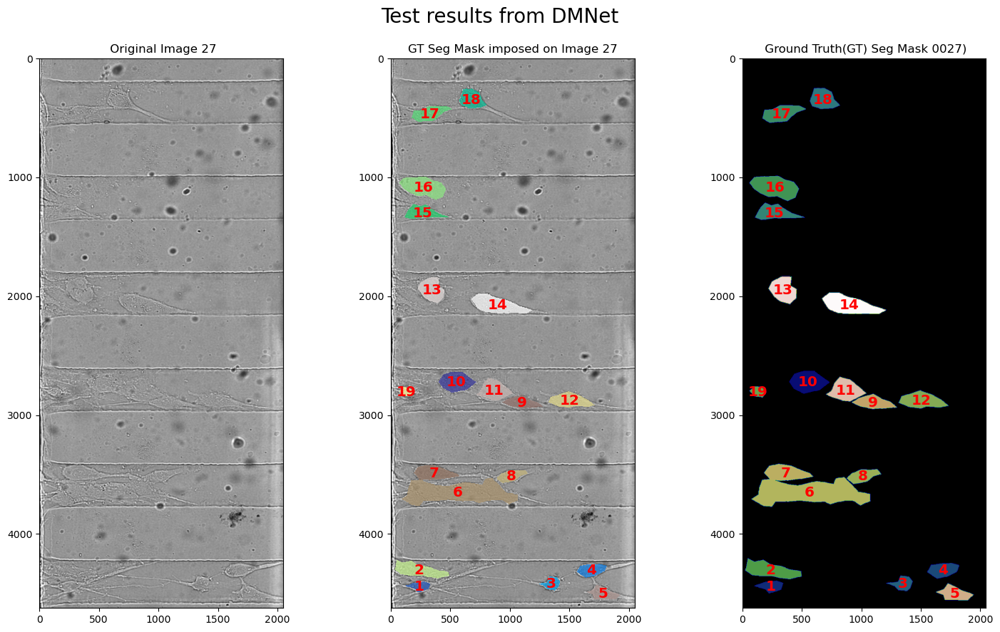

In [8]:

def make_np(img):
    return np.array(img)

def shuffle_labels(img, seed=784):
    # Find the unique labels, excluding 0 (background)
    # array = make_np(img)
    array = img
    unique_labels = np.unique(array[array != 0])

    # Generate new labels (random and unique) for each cell type
    # Ensure new labels do not conflict with existing labels
    # max_label = array.max()
    max_label = 0
    new_labels = np.arange(max_label + 1, max_label + 1 + len(unique_labels))

    # Randomly shuffle the new labels
    np.random.seed(seed)
    np.random.shuffle(new_labels)

    # Create a mapping from old labels to new labels
    label_mapping = {old: new for old, new in zip(unique_labels, new_labels)}

    # Apply the mapping to the array
    shuffled_array = np.copy(array)
    for old_label, new_label in label_mapping.items():
        shuffled_array[array == old_label] = new_label
    return shuffled_array

def plot_labels(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'}):
    ax.imshow(shuffled, cmap='gist_earth')
    ax.set_title(title)
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)



def plot_raw(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'},
                cmap_raw='gray', cmap_seg='gist_earth', alpha=.5):
    ax.imshow(shuffled, cmap=cmap_raw)
    ax.set_title(title)
    
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)

    tmp_seg = shuffle_labels(make_np(original))
    tmp_seg = np.ma.masked_where(tmp_seg == 0, tmp_seg)
    ax.imshow(tmp_seg, alpha=alpha, cmap=cmap_seg)



for i in range(25,28):
    # Path to the raw image (like datasets/raw/Cell_Data/02/imagename.tif)
    # og_img = tiff.imread(f"/home/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data-{data_type}-V1/02/t{i:04d}.tif")
    og_img = tiff.imread(f"/home/MinaHossain/Label_5004/6row_images_min_Original/02/t{i:04d}.tif")
   
    image_path = f"/home/MinaHossain/Label_5004/6row_images_min_Original/02/t{i:04d}.tif"
    seg_img = Image.open(image_path).convert('L')
    seg_lab = Image.open(f"/home/MinaHossain/Label_5004/6row_images_min_Original/02_GT/SEG/man_seg{i:04d}.tif").convert('L')
    
    # Path to the actual mask 
    gt_mask=tiff.imread(f"/home/MinaHossain/Label_5004/6row_images_min_Original/02_GT/SEG/man_seg{i:04d}.tif")
    gt_mask_shuffled = shuffle_labels(gt_mask)
    
      
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(15, 9)
    fig.suptitle('Test results from DMNet ',fontsize=20)
    
    ax[0].imshow(og_img, cmap='gist_gray', alpha=0.99)
    ax[0].set_title(f" Original Image {i}")
    plot_raw(seg_img, make_np(seg_lab), ax[1], f"GT Seg Mask imposed on Image {i}",alpha=.7, cmap_seg='terrain')
    plot_labels(gt_mask_shuffled, gt_mask, ax[2], f" Ground Truth(GT) Seg Mask {i:04d})")
    

    fig.tight_layout()
    fig.subplots_adjust(top=0.9)
    # plt.savefig(f"/home/MinaHossain/DMNet_Rina/Plot_DM-Net/{Data_file}/{i:04d}.png")
    plt.show()
    


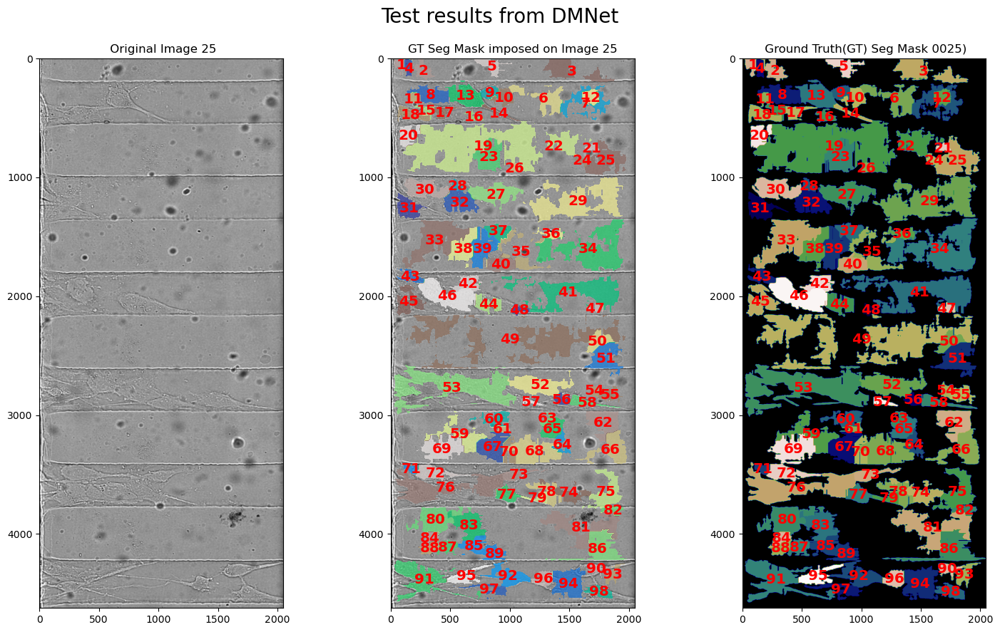

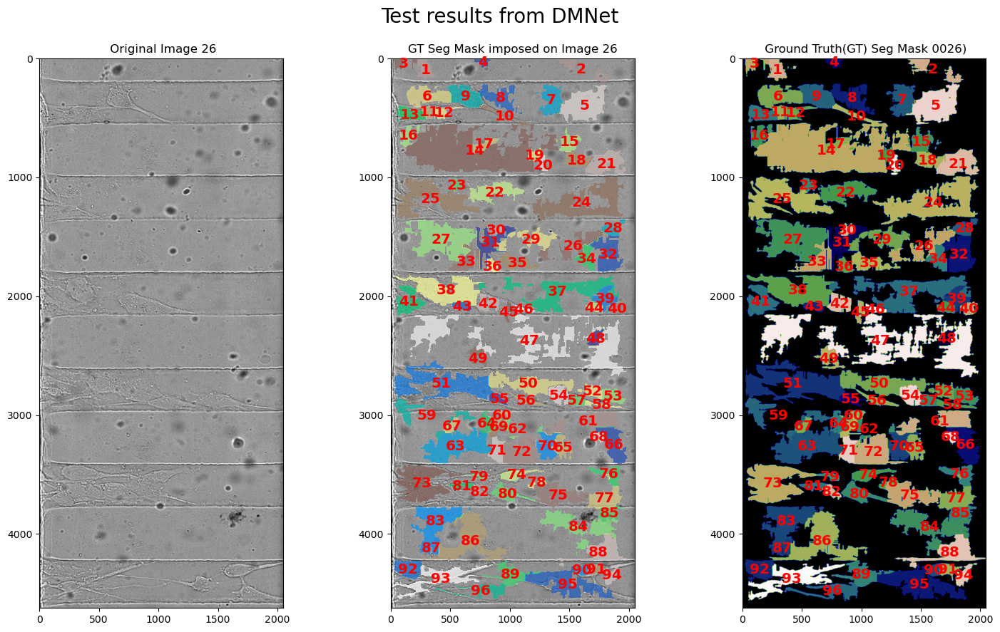

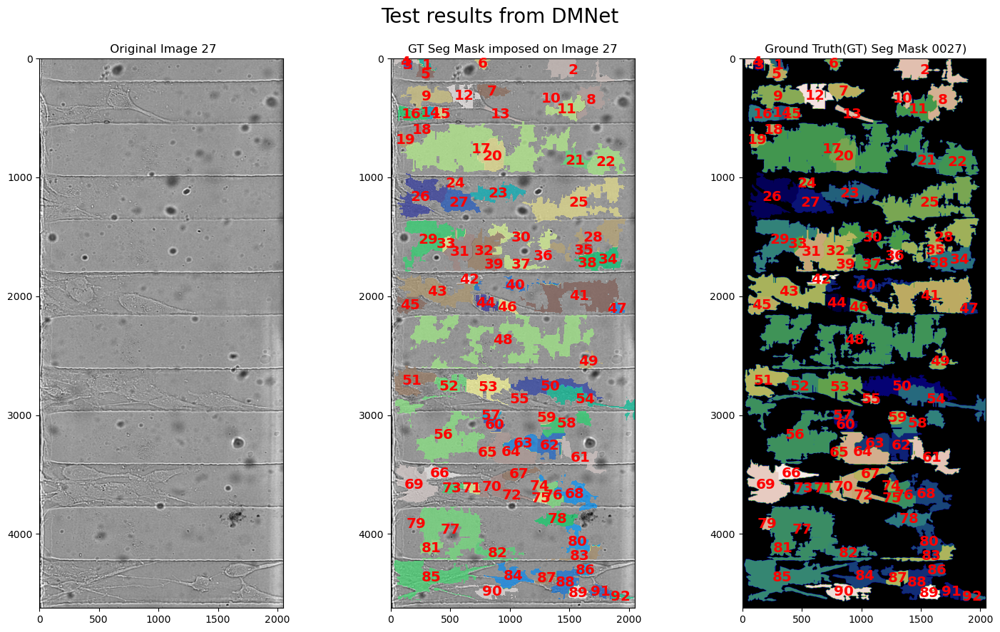

In [12]:

def make_np(img):
    return np.array(img)

def shuffle_labels(img, seed=784):
    # Find the unique labels, excluding 0 (background)
    # array = make_np(img)
    array = img
    unique_labels = np.unique(array[array != 0])

    # Generate new labels (random and unique) for each cell type
    # Ensure new labels do not conflict with existing labels
    # max_label = array.max()
    max_label = 0
    new_labels = np.arange(max_label + 1, max_label + 1 + len(unique_labels))

    # Randomly shuffle the new labels
    np.random.seed(seed)
    np.random.shuffle(new_labels)

    # Create a mapping from old labels to new labels
    label_mapping = {old: new for old, new in zip(unique_labels, new_labels)}

    # Apply the mapping to the array
    shuffled_array = np.copy(array)
    for old_label, new_label in label_mapping.items():
        shuffled_array[array == old_label] = new_label
    return shuffled_array

def plot_labels(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'}):
    ax.imshow(shuffled, cmap='gist_earth')
    ax.set_title(title)
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)



def plot_raw(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'},
                cmap_raw='gray', cmap_seg='gist_earth', alpha=.5):
    ax.imshow(shuffled, cmap=cmap_raw)
    ax.set_title(title)
    
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)

    tmp_seg = shuffle_labels(make_np(original))
    tmp_seg = np.ma.masked_where(tmp_seg == 0, tmp_seg)
    ax.imshow(tmp_seg, alpha=alpha, cmap=cmap_seg)



for i in range(25,28):
    # Path to the raw image (like datasets/raw/Cell_Data/02/imagename.tif)
    # og_img = tiff.imread(f"/home/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data-{data_type}-V1/02/t{i:04d}.tif")
    og_img = tiff.imread(f"/home/MinaHossain/Label_5004/6row_images_min_Original/02/t{i:04d}.tif")
   
    image_path = f"/home/MinaHossain/Label_5004/6row_images_min_Original/02/t{i:04d}.tif"
    seg_img = Image.open(image_path).convert('L')
    seg_lab = Image.open(f"/home/MinaHossain/DMNet_Rina/Cell-Data-P2/03_RES-GT/mask{i:04d}.tif").convert('L')
    
    # Path to the actual mask 
    gt_mask=tiff.imread(f"/home/MinaHossain/DMNet_Rina/Cell-Data-P2/03_RES-GT/mask{i:04d}.tif")
    gt_mask_shuffled = shuffle_labels(gt_mask)
    
      
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(15, 9)
    fig.suptitle('Test results from DMNet ',fontsize=20)
    
    ax[0].imshow(og_img, cmap='gist_gray', alpha=0.99)
    ax[0].set_title(f" Original Image {i}")
    plot_raw(seg_img, make_np(seg_lab), ax[1], f"GT Seg Mask imposed on Image {i}",alpha=.7, cmap_seg='terrain')
    plot_labels(gt_mask_shuffled, gt_mask, ax[2], f" Ground Truth(GT) Seg Mask {i:04d})")
    

    fig.tight_layout()
    fig.subplots_adjust(top=0.9)
    # plt.savefig(f"/home/MinaHossain/DMNet_Rina/Plot_DM-Net/{Data_file}/{i:04d}.png")
    plt.show()
    


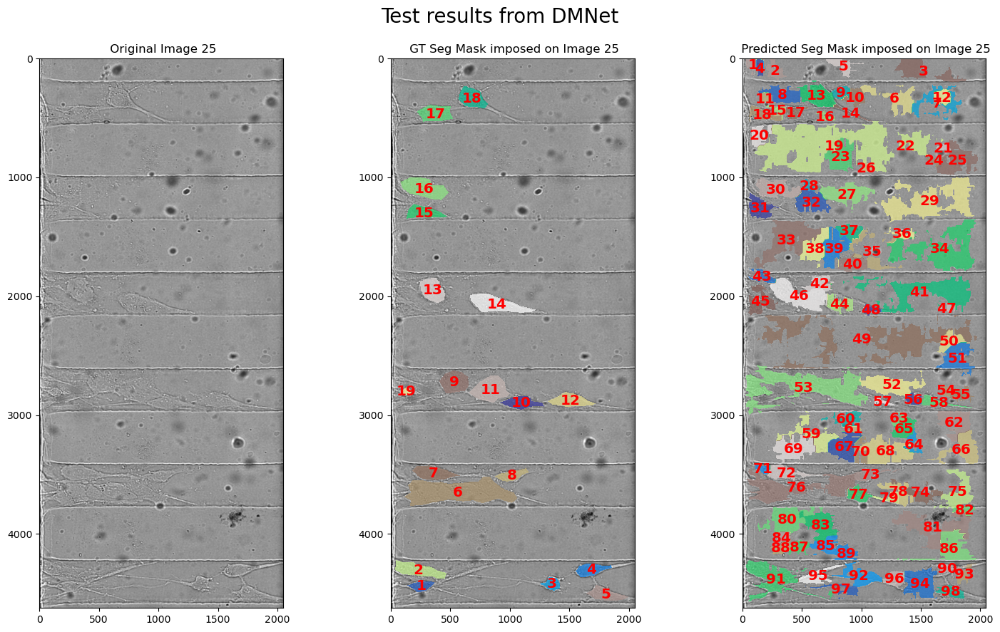

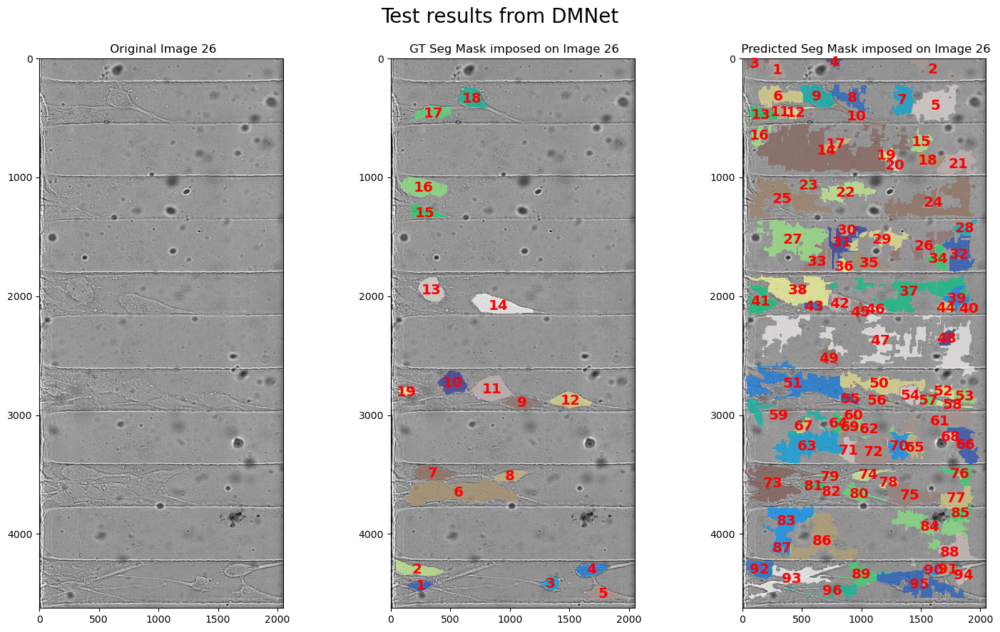

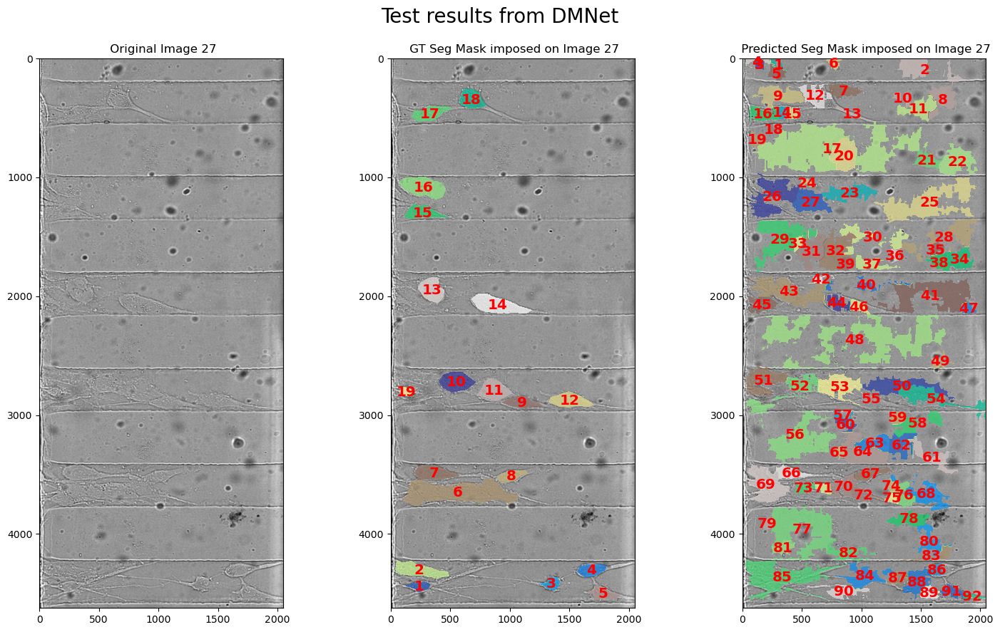

In [13]:

def make_np(img):
    return np.array(img)

def shuffle_labels(img, seed=784):
    # Find the unique labels, excluding 0 (background)
    # array = make_np(img)
    array = img
    unique_labels = np.unique(array[array != 0])

    # Generate new labels (random and unique) for each cell type
    # Ensure new labels do not conflict with existing labels
    # max_label = array.max()
    max_label = 0
    new_labels = np.arange(max_label + 1, max_label + 1 + len(unique_labels))

    # Randomly shuffle the new labels
    np.random.seed(seed)
    np.random.shuffle(new_labels)

    # Create a mapping from old labels to new labels
    label_mapping = {old: new for old, new in zip(unique_labels, new_labels)}

    # Apply the mapping to the array
    shuffled_array = np.copy(array)
    for old_label, new_label in label_mapping.items():
        shuffled_array[array == old_label] = new_label
    return shuffled_array

def plot_labels(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'}):
    ax.imshow(shuffled, cmap='gist_earth')
    ax.set_title(title)
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)



def plot_raw(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'},
                cmap_raw='gray', cmap_seg='gist_earth', alpha=.5):
    ax.imshow(shuffled, cmap=cmap_raw)
    ax.set_title(title)
    
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)

    tmp_seg = shuffle_labels(make_np(original))
    tmp_seg = np.ma.masked_where(tmp_seg == 0, tmp_seg)
    ax.imshow(tmp_seg, alpha=alpha, cmap=cmap_seg)



for i in range(25,28):
    # Path to the raw image (like datasets/raw/Cell_Data/02/imagename.tif)
    # og_img = tiff.imread(f"/home/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data-{data_type}-V1/02/t{i:04d}.tif")
    og_img = tiff.imread(f"/home/MinaHossain/Label_5004/6row_images_min_Original/02/t{i:04d}.tif")


    
    image_path = f"/home/MinaHossain/Label_5004/6row_images_min_Original/02/t{i:04d}.tif"
    seg_img = Image.open(image_path).convert('L')
    seg_lab = Image.open(f"/home/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data-P2/02_GT/SEG/man_seg{i:04d}.tif").convert('L')
   
    # image_path2 = f"/home/MinaHossain/Label_5004/6row_images_min_Original/02/t{i:04d}.tif"
    # seg_img2 = Image.open(image_path2).convert('L')
    seg_lab2 = Image.open(f"/home/MinaHossain/DMNet_Rina/Cell-Data-P2/03_RES-GT/mask{i:04d}.tif").convert('L')
    
       
      
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(15, 9)
    fig.suptitle('Test results from DMNet ',fontsize=20)
    
    ax[0].imshow(og_img, cmap='gist_gray', alpha=0.99)
    ax[0].set_title(f" Original Image {i}")
    plot_raw(seg_img, make_np(seg_lab), ax[1], f" GT Seg Mask imposed on Image {i}",alpha=.7, cmap_seg='terrain')
    plot_raw(seg_img, make_np(seg_lab2), ax[2], f" Predicted Seg Mask imposed on Image {i}",alpha=.7, cmap_seg='terrain')
    
    

    fig.tight_layout()
    fig.subplots_adjust(top=0.9)
    # plt.savefig(f"/home/MinaHossain/DMNet_Rina/Plot_DM-Net/{Data_file}/{i:04d}.png")
    plt.show()
    


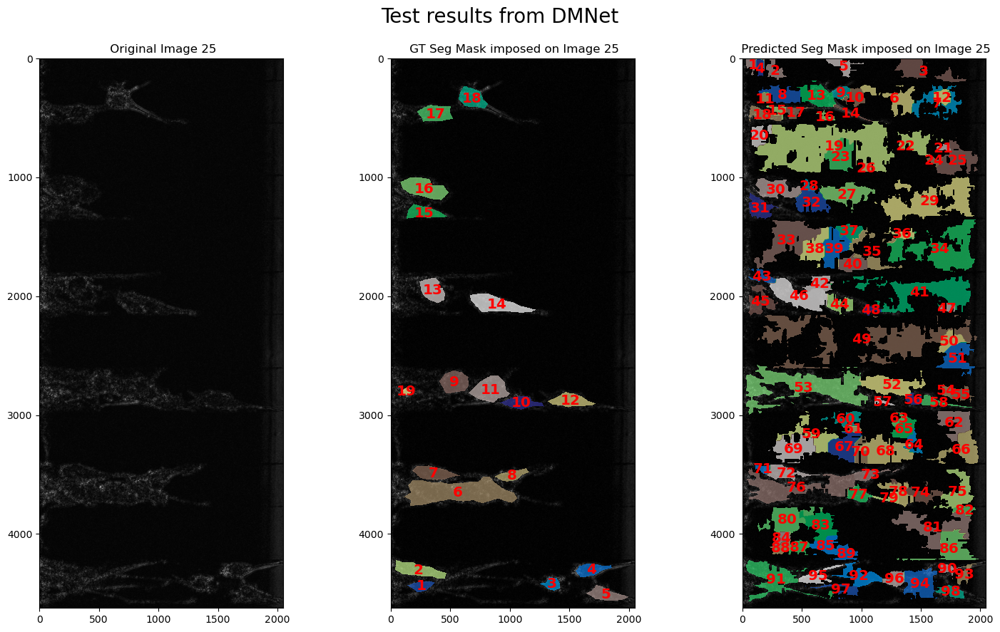

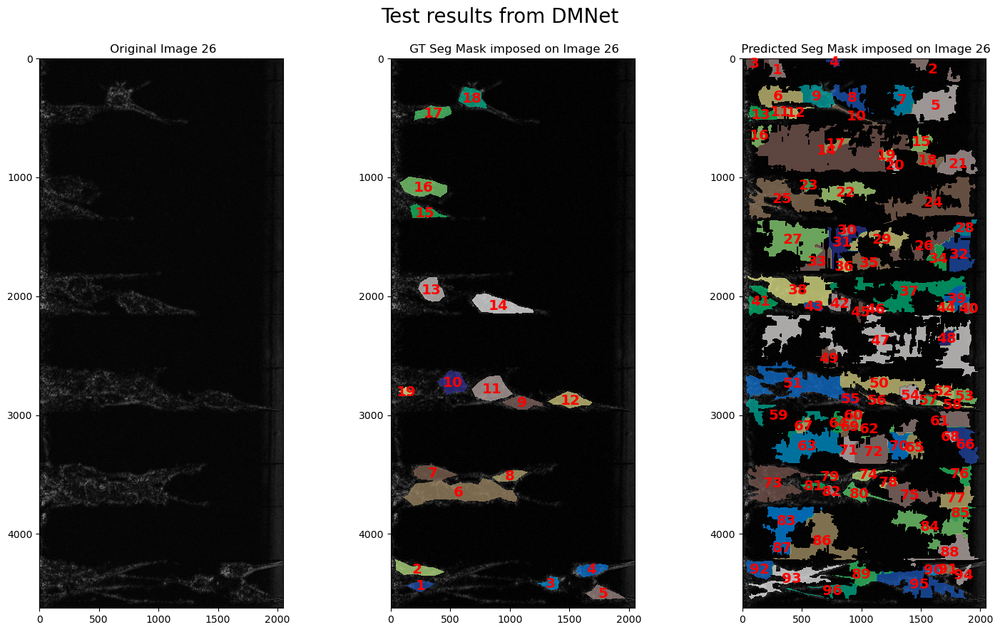

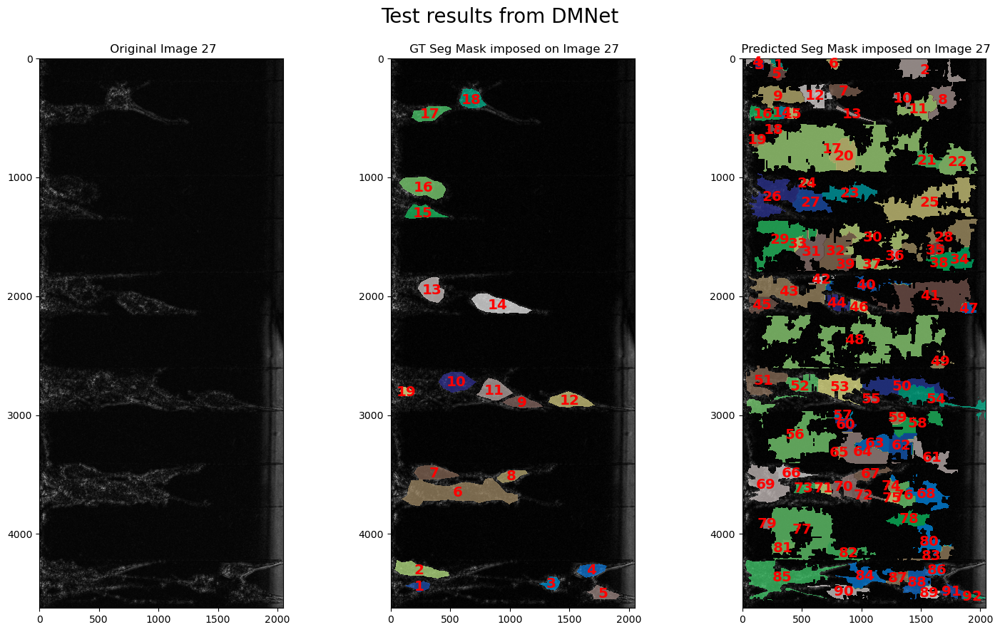

In [14]:

def make_np(img):
    return np.array(img)

def shuffle_labels(img, seed=784):
    # Find the unique labels, excluding 0 (background)
    # array = make_np(img)
    array = img
    unique_labels = np.unique(array[array != 0])

    # Generate new labels (random and unique) for each cell type
    # Ensure new labels do not conflict with existing labels
    # max_label = array.max()
    max_label = 0
    new_labels = np.arange(max_label + 1, max_label + 1 + len(unique_labels))

    # Randomly shuffle the new labels
    np.random.seed(seed)
    np.random.shuffle(new_labels)

    # Create a mapping from old labels to new labels
    label_mapping = {old: new for old, new in zip(unique_labels, new_labels)}

    # Apply the mapping to the array
    shuffled_array = np.copy(array)
    for old_label, new_label in label_mapping.items():
        shuffled_array[array == old_label] = new_label
    return shuffled_array

def plot_labels(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'}):
    ax.imshow(shuffled, cmap='gist_earth')
    ax.set_title(title)
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)



def plot_raw(shuffled, original, ax, title=None,
                txt_args={'color':'red', 'ha':'center', 'va':'center', 
                          'fontsize':'x-large', 'fontweight':'bold'},
                cmap_raw='gray', cmap_seg='gist_earth', alpha=.5):
    ax.imshow(shuffled, cmap=cmap_raw)
    ax.set_title(title)
    
    for label in np.unique(original):
        if label != 0:
            inds = np.argwhere(original == label)
            loc = inds.mean(0)
            ax.text(loc[1], loc[0], str(label), **txt_args)

    tmp_seg = shuffle_labels(make_np(original))
    tmp_seg = np.ma.masked_where(tmp_seg == 0, tmp_seg)
    ax.imshow(tmp_seg, alpha=alpha, cmap=cmap_seg)



for i in range(25,28):
    # Path to the raw image (like datasets/raw/Cell_Data/02/imagename.tif)
    # og_img = tiff.imread(f"/home/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data-{data_type}-V1/02/t{i:04d}.tif")
    og_img = tiff.imread(f"/home/MinaHossain/Label_5004/6row_images_min_B/02/t{i:04d}.tif")


    
    image_path = f"/home/MinaHossain/Label_5004/6row_images_min_B/02/t{i:04d}.tif"
    seg_img = Image.open(image_path).convert('L')
    seg_lab = Image.open(f"/home/MinaHossain/DMNet_Rina/training_codes/Data/train/Cell-Data-P2/02_GT/SEG/man_seg{i:04d}.tif").convert('L')
   
    # image_path2 = f"/home/MinaHossain/Label_5004/6row_images_min_Original/02/t{i:04d}.tif"
    # seg_img2 = Image.open(image_path2).convert('L')
    seg_lab2 = Image.open(f"/home/MinaHossain/DMNet_Rina/Cell-Data-P2/03_RES-GT/mask{i:04d}.tif").convert('L')
    
       
      
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(15, 9)
    fig.suptitle('Test results from DMNet ',fontsize=20)
    
    ax[0].imshow(og_img, cmap='gist_gray', alpha=0.99)
    ax[0].set_title(f" Original Image {i}")
    plot_raw(seg_img, make_np(seg_lab), ax[1], f" GT Seg Mask imposed on Image {i}",alpha=.7, cmap_seg='terrain')
    plot_raw(seg_img, make_np(seg_lab2), ax[2], f" Predicted Seg Mask imposed on Image {i}",alpha=.7, cmap_seg='terrain')
    
    

    fig.tight_layout()
    fig.subplots_adjust(top=0.9)
    # plt.savefig(f"/home/MinaHossain/DMNet_Rina/Plot_DM-Net/{Data_file}/{i:04d}.png")
    plt.show()
    
